___

#### Rick Fontenot
___


In [189]:
# Imports
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from datetime import date
import sklearn
pd.set_option("display.max_columns", None, "display.max_rows", None)

import os
import sys
import tempfile
import mimetypes
import webbrowser

# Import the email modules we'll need
from email import policy
from email.parser import BytesParser

import re
import email


## Test reading in a single file as an example:


In [190]:
sample_file = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/easy_ham/00001.7c53336b37003a9286aba55d2945844c'

In [191]:
with open(sample_file, "r",encoding= 'utf-8', errors='ignore') as f:
    message_imported = email.message_from_file(f).get_payload().replace("\n"," ")

message_imported

'    Date:        Wed, 21 Aug 2002 10:54:46 -0500     From:        Chris Garrigues <cwg-dated-1030377287.06fa6d@DeepEddy.Com>     Message-ID:  <1029945287.4797.TMDA@deepeddy.vircio.com>     | I can\'t reproduce this error.  For me it is very repeatable... (like every time, without fail).  This is the debug log of the pick happening ...  18:19:03 Pick_It {exec pick +inbox -list -lbrace -lbrace -subject ftp -rbrace -rbrace} {4852-4852 -sequence mercury} 18:19:03 exec pick +inbox -list -lbrace -lbrace -subject ftp -rbrace -rbrace 4852-4852 -sequence mercury 18:19:04 Ftoc_PickMsgs {{1 hit}} 18:19:04 Marking 1 hits 18:19:04 tkerror: syntax error in expression "int ...  Note, if I run the pick command by hand ...  delta$ pick +inbox -list -lbrace -lbrace -subject ftp -rbrace -rbrace  4852-4852 -sequence mercury 1 hit  That\'s where the "1 hit" comes from (obviously).  The version of nmh I\'m using is ...  delta$ pick -version pick -- nmh-1.0.4 [compiled on fuchsia.cs.mu.OZ.AU at Sun Mar 17 1

In [192]:
#This code model is from https://docs.python.org/3/library/email.examples.html

# In a real program you'd get the filename from the arguments.
with open(sample_file, 'rb') as fp:
    msg = BytesParser(policy=policy.default).parse(fp)

# Now the header items can be accessed as a dictionary, and any non-ASCII will
# be converted to unicode:
print('To:', msg['to'])
print('From:', msg['from'])
print('Subject:', msg['subject'])

To: Chris Garrigues <cwg-dated-1030377287.06fa6d@DeepEddy.Com>
From: Robert Elz <kre@munnari.OZ.AU>
Subject: Re: New Sequences Window


In [193]:
msg.keys()

['Return-Path',
 'Delivered-To',
 'Received',
 'Received',
 'Received',
 'Received',
 'Delivered-To',
 'Received',
 'Received',
 'Received',
 'Received',
 'Received',
 'Received',
 'From',
 'To',
 'Cc',
 'Subject',
 'In-Reply-To',
 'References',
 'MIME-Version',
 'Content-Type',
 'Message-Id',
 'X-Loop',
 'Sender',
 'Errors-To',
 'X-Beenthere',
 'X-Mailman-Version',
 'Precedence',
 'List-Help',
 'List-Post',
 'List-Subscribe',
 'List-Id',
 'List-Unsubscribe',
 'List-Archive',
 'Date']

In [194]:
msg['Subject']

'Re: New Sequences Window'

Try to extract just the subject

In [195]:
with open(sample_file, 'rb') as fp:
    subject = BytesParser(policy=policy.default).parse(fp)['Subject']

subject

'Re: New Sequences Window'

In [196]:
with open(sample_file, 'rb') as fp:
    file_id = BytesParser(policy=policy.default).parse(fp)['Message-Id'].replace("<","").replace(">","")

file_id

'13258.1030015585@munnari.OZ.AU'

## Now that we have a process for reading elements of a file, we will read in all the files from subfolders and organize into a data frame

### Easy Ham

In [197]:
easy_ham_dir = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/easy_ham/'

os.chdir(easy_ham_dir)
all_files = os.listdir()

easy_ham_df = pd.DataFrame(columns = ["file_id", "subject", "body"])

for file in all_files:
    file_id=file
    with open(file, 'rb') as fp:
        subject = BytesParser(policy=policy.default).parse(fp)['Subject']
    with open(file, "r",encoding= 'utf-8', errors='ignore') as f:
        body = email.message_from_file(f).get_payload()
    row = pd.Series((file_id,subject,body), index = easy_ham_df.columns)
    easy_ham_df = easy_ham_df.append(row, ignore_index=True)    

print(len(all_files))
print(easy_ham_df.shape)

easy_ham_df['Group']='easy_ham'
easy_ham_df['Is_Spam']=0
easy_ham_df.head(10)
   

5052
(5052, 3)


,file_id,subject,body,Group,Is_Spam
0,2170.78c282a5e417d6d231dc75aa8588ebb7,Priceless Rubens works stolen in raid on mansion,"URL: http://www.newsisfree.com/click/-1,838114...",easy_ham,0
1,0461.7609029b07acf65f40bd93882aa35887,Making a mesh on the move,\nhttp://www.guardian.co.uk/Print/0%2c3858%2c4...,easy_ham,0
2,00769.25bf9a767b5db0ed93f03c1637281663,Re: liberal defnitions,"\nIn a message dated 9/24/2002 11:24:58 AM, ja...",easy_ham,0
3,01074.8590d61ac0aeeadb58dc2f2ba776c406,problems with apt update,"Hiya, I always seem to get errors when I do an...",easy_ham,0
4,02479.14365bcad3a60fcf24c5c1813f6291fb,Re: Are bad developer libraries the problem wi...,\nI don't know how one can expect better and m...,easy_ham,0
5,1077.5967a2892063a3470f32596403b095aa,Re: Sorting,> > You're probably running exmh on a local ma...,easy_ham,0
6,1000.348e8a82897b05d584de019f4dd5c7e2,RE: Java is for kiddies,"On Sun, 1 Sep 2002, Reza B'Far (eBuilt) wrote:...",easy_ham,0
7,2125.ee1e93366c2199584cfbd4cbb353d918,Skateboarder drives-through Subway. With his face,"URL: http://www.newsisfree.com/click/-5,829698...",easy_ham,0
8,0401.9ab0bcc81e70d6930acfefc2854a0172,Re: Canadians,">>>>> ""O"" == Owen Byrne <owen@permafrost.net> ...",easy_ham,0
9,0502.9e78d7d003ceeef52c70ac7e7b786ef9,Re: Ouch... [Bebergflame],Adam Beberg writes:\n> Shouldn't a politician ...,easy_ham,0


## Easy Ham 2

In [198]:
easy_ham_2_dir = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/easy_ham_2/'

os.chdir(easy_ham_2_dir)
all_files = os.listdir()

easy_ham_2_df = pd.DataFrame(columns = ["file_id", "subject", "body"])

for file in all_files:
    file_id=file
    with open(file, 'rb') as fp:
        subject = BytesParser(policy=policy.default).parse(fp)['Subject']
    with open(file, "r",encoding= 'utf-8', errors='ignore') as f:
        body = email.message_from_file(f).get_payload()
    row = pd.Series((file_id,subject,body), index = easy_ham_2_df.columns)
    easy_ham_2_df = easy_ham_2_df.append(row, ignore_index=True)    

print(len(all_files))
print(easy_ham_2_df.shape)

easy_ham_2_df['Group']='easy_ham_2'
easy_ham_2_df['Is_Spam']=0
easy_ham_2_df.head(10)

1401
(1401, 3)


,file_id,subject,body,Group,Is_Spam
0,01128.efb36914ecb55d78a894591eff0843c5,Re: Ximian apt repos?,"On Sun, 21 Jul 2002 10:51:51 -0500\nBrian Fahr...",easy_ham_2,0
1,00659.02e6dd777f837798533eae8f3b6a0491,[WM] The MIME information you requested (last ...,----------------------------------------------...,easy_ham_2,0
2,00776.7df92458e9cf04b8873c406bde7d2fbe,A message for our times,"I'm not up to forking the text, but for your e...",easy_ham_2,0
3,00116.409b29c26edef06268b4bfa03ef1367a,Re: [ILUG] vanquishing the daemons of shell sc...,"On Sat, Jul 20, 2002 at 12:18:57PM +0100, Kenn...",easy_ham_2,0
4,00615.23556d88fcb1179b25083cfc41017f42,Re: [Razor-users] Using Razor with non-mbox files,"> ----- Original Message -----\n> Date: Thu, 0...",easy_ham_2,0
5,00715.c11e77af45a2debe41aed46b2be09d59,"Re: ""Ouch. Ouch. Ouch. Ouch. Ouch....""(was Re:...",\nMusic school jokes --\n\nAmerican conductor ...,easy_ham_2,0
6,01200.7cad0240e6c9e66d013ca8a7c2268871,Re: Pango problems,I find Gnome2 with Red Hat's Limbo to be quite...,easy_ham_2,0
7,00834.c820e444255bc80fafd01933f05703d6,Re: [Baseline] Raising chickens the high-tech way,\n\n> It also strikes me that it will not be v...,easy_ham_2,0
8,00568.4bfc868e8de382e58f6d9baee080b56a,Re: [Razor-users] report automation with pine?,"\n----- Original Message ----- \nFrom: ""Forres...",easy_ham_2,0
9,00439.4588d5306e105aa80c51978dfc505d3f,Re: [ILUG] expanding a string multiple times,"\nOn Pungenday, the 9th day of Bureaucracy, Pa...",easy_ham_2,0


## Hard Ham

In [199]:
hard_ham_dir = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/hard_ham/'

os.chdir(hard_ham_dir)
all_files = os.listdir()

hard_ham_df = pd.DataFrame(columns = ["file_id", "subject", "body"])

for file in all_files:
    file_id=file
    with open(file, 'rb') as fp:
        subject = BytesParser(policy=policy.default).parse(fp)['Subject']
    with open(file, "r",encoding= 'utf-8', errors='ignore') as f:
        body = email.message_from_file(f).get_payload()
    row = pd.Series((file_id,subject,body), index = hard_ham_df.columns)
    hard_ham_df = hard_ham_df.append(row, ignore_index=True)    

print(len(all_files))
print(hard_ham_df.shape)

hard_ham_df['Group']='hard_ham'
hard_ham_df['Is_Spam']=0
hard_ham_df.head(10)

501
(501, 3)


,file_id,subject,body,Group,Is_Spam
0,0035.4fe7648654fa3fa1ae5379894f00474f,NEWS.COM INVESTOR: Battered stocks regain ground,<html>\n<head>\n<title>CNET Investor Dispatch<...,hard_ham,0
1,00113.1d37bdbcad4975b5012cc6d87a048ecf,[Lockergnome Windows Daily] Sticker Courtesy,<html><head><!--\n\n\n CLICK HERE to read...,hard_ham,0
2,00165.4e1923f1c9091dc00d79dfe004eedf26,Re: remove,"> Seriously though, it spurs the question: sho...",hard_ham,0
3,00044.b2f03a4d512deb2c4702a3bd60a4fd88,Great deals on perfect Summer cameras! (CNET S...,\n<html>\n<head>\n\t<title>Shopper Newsletter:...,hard_ham,0
4,00138.1bf66894faa2d923b2a673a016dc6afd,How Microsoft plans to take over your living r...,\n\n <html>\n\n<head>\n<title>ZDNet AnchorDesk...,hard_ham,0
5,0044.27a8944e81a2e9238f2de89eca51321d,[Lockergnome Tech Specialist] Geothermal Caff...,<html><head><!--\n\n\n CLICK HERE to read...,hard_ham,0
6,00211.1ca67c3677fa0051ccfa27c756d32b5a,[NOVICE] pl/pgsql and returns timestamp type,"Hi all,\n\nI cannot to get this to run... I t...",hard_ham,0
7,00201.04e4c8ef93080eea4b11213262ece700,Ashfield Online 9/1/2002 by Aric McKeown,<html><head><title>Ashfield Online email subsc...,hard_ham,0
8,00013.15135df1ed8198dbea3fcd0cb8d071ae,"This week: Deck, Tex-Edit Plus, Boom","CNET | DOWNLOAD DISPATCH(Mac Edition)\nJuly 9,...",hard_ham,0
9,00019.e35a7a6a1a6bdd0d2e164db2f6a0e4ef,[Lockergnome Tech Specialist] Handprint Singing,<html><head><!--\n\n\n CLICK HERE to read...,hard_ham,0


## Spam

In [200]:
spam_dir = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/spam/'

os.chdir(spam_dir)
all_files = os.listdir()

spam_df = pd.DataFrame(columns = ["file_id", "subject", "body"])

for file in all_files:
    file_id=file
    with open(file, 'rb') as fp:
        subject = BytesParser(policy=policy.default).parse(fp)['Subject']
    with open(file, "r",encoding= 'utf-8', errors='ignore') as f:
        body = email.message_from_file(f).get_payload()
    row = pd.Series((file_id,subject,body), index = spam_df.columns)
    spam_df = spam_df.append(row, ignore_index=True)    

print(len(all_files))
print(spam_df.shape)

spam_df['Group']='spam'
spam_df['Is_Spam']=1
spam_df.head(10)

1001
(1001, 3)


,file_id,subject,body,Group,Is_Spam
0,00249.5f45607c1bffe89f60ba1ec9f878039a,Let us find the right mortgage lender for you ...,"Dear Homeowner,\n \nInterest Rates are at thei...",spam,1
1,0355.94ebf637e4bd3db8a81c8ce68ecf681d,"Friend, Copy ANY DVD or Playstation Game with ...","[[Content-Type, Content-Transfer-Encoding], [C...",spam,1
2,0395.bb934e8b4c39d5eab38f828a26f760b4,5% Guaranteed for Eight Years,"[[Content-Type, Content-Transfer-Encoding], [C...",spam,1
3,0485.9021367278833179285091e5201f5854,Congratulations! You Get a Free Handheld Organ...,<html><head>\n<title>Congratulations! You Get ...,spam,1
4,00373.ebe8670ac56b04125c25100a36ab0510,PROTECT YOUR INFORMATION AND YOUR COMPUTER,ATTENTION: This is a MUST for ALL Computer Use...,spam,1
5,0343.0630afbe4ee1ffd0db0ffb81c6de98de,One of a kind Money maker! Try it for free!,"[[Content-Type, Content-Transfer-Encoding]]",spam,1
6,00214.1367039e50dc6b7adb0f2aa8aba83216,We Dare You to Find a Better Annuity,"[[Content-Type, Content-Transfer-Encoding], [C...",spam,1
7,0125.44381546181fc6c5d7ea59e917f232c5,Online Doctors will fill your Viagra Prescript...,YOUR SEX DRIVE SHOULD NEVER BE SECOND ON THE L...,spam,1
8,00210.050ffd105bd4e006771ee63cabc59978,"$14.95 per year for .COM, .BIZ, and .INFO exte...",IMPORTANT INFORMATION:\n\nThe new domain names...,spam,1
9,0108.4506c2ef846b80b9a7beb90315b22701,Take your Marketing to the Next Level,<html>\n<head>\n<title>Digital Publishing Tool...,spam,1


## Spam 2

In [201]:
spam_2_dir = '/Users/rickfontenot/Dropbox/SMU/DS7333 Quantifying World/QTW_Github/QTW/Case Study 3/data/spam_2/'

os.chdir(spam_2_dir)
all_files = os.listdir()

spam_2_df = pd.DataFrame(columns = ["file_id", "subject", "body"])

for file in all_files:
    file_id=file
    with open(file, 'rb') as fp:
        subject = BytesParser(policy=policy.default).parse(fp)['Subject']
    with open(file, "r",encoding= 'utf-8', errors='ignore') as f:
        body = email.message_from_file(f).get_payload()
    row = pd.Series((file_id,subject,body), index = spam_2_df.columns)
    spam_2_df = spam_2_df.append(row, ignore_index=True)    

print(len(all_files))
print(spam_2_df.shape)

spam_2_df['Group']='spam_2'
spam_2_df['Is_Spam']=1
spam_2_df.head(10)

1398
(1398, 3)


,file_id,subject,body,Group,Is_Spam
0,01246.d0ee9c7ebf9d953b21de9414cc96c2f9,Dialogue et Rencontre ? Rejoins nous !,"[[Content-type], [Content-Type, Content-Transf...",spam_2,1
1,01099.f33c6cb5a233f19e1dc1956871c50681,Take your love life to the next level ...,<HTML>\n<HEAD>\n</HEAD>\n<BODY>\n<FONT SIZE=3D...,spam_2,1
2,00346.d93a823fb3350a5da8f0c612ce1156cd,[dcms-dev] MY INHERITANCE,"Date:May 16,2002. \nEmail:edum@hkem.com. \n\nD...",spam_2,1
3,00012.cb9c9f2a25196f5b16512338625a85b4,Gain Major Cash,\n<HTML>\n<BODY>\n\nOWN YOUR VERY OWN FREE CAS...,spam_2,1
4,00993.32d00ccd0a831830838667fed1371d5f,"< Make $50,000 in 90 Days Sending Emails at Ho...","\nHi,\n\nYou can make $50,000 or more in the n...",spam_2,1
5,01393.e7d7a58f2c561c6f71fe95c64a7f5f35,Reverse Aging While Burning Fat,"<html>\n<head>\n <meta http-equiv=""Content-...",spam_2,1
6,01077.526ad4ce12f3ef73a4b4eae0f211e2c9,Checking Account update,"[[Content-Type, Content-Transfer-Encoding], [C...",spam_2,1
7,00722.1ec5e1f05520ad5119de960f77f965d1,[SA] [Ginger] has sent you a webcam invitation!,Dear Dr. Schaefer:\n\nI would greatly apprecia...,spam_2,1
8,01195.2e0668d1365c631aa09d21c813ce013f,HELP WANTED. WORK FROM HOME. FREE INFO,WE NEED HELP. We are a 14 year old fortune 50...,spam_2,1
9,00234.64c94421011e896adab852386cd314d8,Joke-Of -The- Day,<html><body><center><a href=http://www.vitafac...,spam_2,1


In [202]:
messages_df = pd.concat([easy_ham_df, easy_ham_2_df, hard_ham_df, spam_df, spam_2_df], axis=0)

In [203]:
print(messages_df.shape)

(9353, 5)


easy_ham = 5052
easy_ham_2 = 1401
hard_ham = 501
Spam = 1001
spam_2 = 1398

Total = 9353

### Our dataframe has 9353 records matching the total number of files

In [204]:
messages_df.head()

,file_id,subject,body,Group,Is_Spam
0,2170.78c282a5e417d6d231dc75aa8588ebb7,Priceless Rubens works stolen in raid on mansion,"URL: http://www.newsisfree.com/click/-1,838114...",easy_ham,0
1,0461.7609029b07acf65f40bd93882aa35887,Making a mesh on the move,\nhttp://www.guardian.co.uk/Print/0%2c3858%2c4...,easy_ham,0
2,00769.25bf9a767b5db0ed93f03c1637281663,Re: liberal defnitions,"\nIn a message dated 9/24/2002 11:24:58 AM, ja...",easy_ham,0
3,01074.8590d61ac0aeeadb58dc2f2ba776c406,problems with apt update,"Hiya, I always seem to get errors when I do an...",easy_ham,0
4,02479.14365bcad3a60fcf24c5c1813f6291fb,Re: Are bad developer libraries the problem wi...,\nI don't know how one can expect better and m...,easy_ham,0


### Remove '/n' from body and subject

In [205]:
messages_df['body'] = messages_df['body'].str.replace('\n','')
messages_df['subject'] = messages_df['subject'].str.replace('\n','')

messages_df.head()

,file_id,subject,body,Group,Is_Spam
0,2170.78c282a5e417d6d231dc75aa8588ebb7,Priceless Rubens works stolen in raid on mansion,"URL: http://www.newsisfree.com/click/-1,838114...",easy_ham,0
1,0461.7609029b07acf65f40bd93882aa35887,Making a mesh on the move,http://www.guardian.co.uk/Print/0%2c3858%2c448...,easy_ham,0
2,00769.25bf9a767b5db0ed93f03c1637281663,Re: liberal defnitions,"In a message dated 9/24/2002 11:24:58 AM, jame...",easy_ham,0
3,01074.8590d61ac0aeeadb58dc2f2ba776c406,problems with apt update,"Hiya, I always seem to get errors when I do an...",easy_ham,0
4,02479.14365bcad3a60fcf24c5c1813f6291fb,Re: Are bad developer libraries the problem wi...,I don't know how one can expect better and mor...,easy_ham,0


In [206]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
# tokenize and build vocab
vectorizer.fit(messages_df.body.apply(lambda x: np.str_(x)))

body_counts = (vectorizer.vocabulary_)
body_counts = pd.DataFrame.from_dict(body_counts, orient='index')
body_counts.reset_index(inplace=True)
body_counts = body_counts.rename(columns = {'index':'Word'})
body_counts = body_counts.rename(columns={body_counts.columns[1]: 'count'})
body_counts = body_counts.sort_values(by='count', key=abs, ascending=False)

body_counts.head(20)

,Word,count
92092,𬣤jӡa,116301
92105,𬣡b,116300
115853,ﵽvīgρaggyipﵽġc,116299
115846,ﵽvawry,116298
95533,쵥λ,116297
92079,줽ǥx,116296
95547,죺ʹҵʾչչ,116295
88673,뷽ݵi,116294
91753,鼭ƽ,116293
98319,隊x,116292


In [207]:
body_counts.tail(20)

,Word,count
112506,0000000021,19
112508,0000000000069,18
112507,00000000000114,17
112509,0000000000002,16
112485,00000000000000000364,15
112413,000000000000000000000365,14
112415,0000000000000000000000000000325,13
112486,00000000000000000000000000000000325,12
112414,00000000000000000000000000000000000000000364,11
112411,000000000000000000000000000,10


In [208]:
body_counts = body_counts.sort_values(by='Word', ascending=False)
body_counts.head(10)

,Word,count
92092,𬣤jӡa,116301
92105,𬣡b,116300
115853,ﵽvīgρaggyipﵽġc,116299
115846,ﵽvawry,116298
95533,쵥λ,116297
92079,줽ǥx,116296
95547,죺ʹҵʾչչ,116295
88673,뷽ݵi,116294
91753,鼭ƽ,116293
98319,隊x,116292


# Should these strange characters be removed? 
They could be important, let's check if they are high count in both spam and not-spam messages

In [209]:
ham_body = messages_df[messages_df['Is_Spam'] == 0]

vectorizer.fit(ham_body.body.apply(lambda x: np.str_(x)))

ham_body_counts = (vectorizer.vocabulary_)
ham_body_counts = pd.DataFrame.from_dict(ham_body_counts, orient='index')
ham_body_counts.reset_index(inplace=True)
ham_body_counts = ham_body_counts.rename(columns = {'index':'Word'})
ham_body_counts = ham_body_counts.rename(columns={ham_body_counts.columns[1]: 'count'})
ham_body_counts = ham_body_counts.sort_values(by='count', key=abs, ascending=False)

ham_body_counts.head(20)

,Word,count
47698,ű__,88562
10182,zzzzteana,88561
45495,zzzzcc,88560
16575,zzzz,88559
10224,zzzlist,88558
84857,zzzickeletto,88557
79287,zzzf,88556
68066,zzzason,88555
80432,zzz,88554
40297,zzmp3,88553


In [210]:
spam_body = messages_df[messages_df['Is_Spam'] == 1]

vectorizer.fit(spam_body.body.apply(lambda x: np.str_(x)))

spam_body_counts = (vectorizer.vocabulary_)
spam_body_counts = pd.DataFrame.from_dict(spam_body_counts, orient='index')
spam_body_counts.reset_index(inplace=True)
spam_body_counts = spam_body_counts.rename(columns = {'index':'Word'})
spam_body_counts = spam_body_counts.rename(columns={spam_body_counts.columns[1]: 'count'})
spam_body_counts = spam_body_counts.sort_values(by='count', key=abs, ascending=False)

spam_body_counts.head(20)

,Word,count
8475,𬣤jӡa,42160
8492,𬣡b,42159
41637,ﵽvīgρaggyipﵽġc,42158
41630,ﵽvawry,42157
14816,쵥λ,42156
8460,줽ǥx,42155
14834,죺ʹҵʾչչ,42154
946,뷽ݵi,42153
7884,鼭ƽ,42152
17691,隊x,42151


The sepcial characters seem to be more prevalent in spam messages so they could be important predictors, we will keep them and use tf-idf vectorizer instead of count vectorizer

In [211]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.linear_model import LogisticRegression
from sklearn import metrics as mt
from sklearn.metrics import confusion_matrix
from sklearn.metrics import make_scorer
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

import time

Split the host dataframe to preserve a validation set for comparing models after tuning on CV of initial train/test split. We are using the stratified shuffle split so the validation set is representative of classes, as well as random_state so the if this code is run multiple times we get the same splits for consistentcySplit the host dataframe to preserve a validation set for comparing models after tuning on CV of initial train/test split. We are using the stratified shuffle split so the validation set is representative of classes, as well as random_state so the if this code is run multiple times we get the same splits for consistentcy

In [212]:
from sklearn.model_selection import StratifiedShuffleSplit

split = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)
for train_index, test_valid_index in split.split(messages_df, messages_df.Is_Spam):
    email_modeling = messages_df.iloc[train_index]
    email_validation = messages_df.iloc[test_valid_index]

In [213]:
print("Size of modeling set (to be CV split): ",email_modeling.shape)
print("Size of hold back validation set: ",email_validation.shape)

Size of modeling set (to be CV split):  (8417, 5)
Size of hold back validation set:  (936, 5)


In [431]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words=None, use_idf=True, norm=None)
tfidf_body_fit = vectorizer.fit(email_modeling.body.apply(lambda x: np.str_(x)))

tfidf_body_train = tfidf_body_fit.transform(email_modeling.body.apply(lambda x: np.str_(x)))
tfidf_body_validation = tfidf_body_fit.transform(email_validation.body.apply(lambda x: np.str_(x)))


In [432]:
tfidf_body_train.shape

(8417, 113414)

In [467]:
tfidf_body_fit.vocabulary_

{'url': 106284,
 'http': 61425,
 'diveintomark': 45884,
 'org': 80226,
 'archives': 28578,
 '2002': 7731,
 '10': 5042,
 '03': 3705,
 'html': 61218,
 'catching_update': 37026,
 '03t22': 3814,
 '04': 3815,
 '05': 3940,
 '00': 0,
 '_phil': 22981,
 'ringnalda_': 90089,
 'hey': 60120,
 'radio': 87294,
 'this': 102037,
 'pre': 84785,
 'for': 54556,
 'you': 112155,
 '8220': 19601,
 'did': 45095,
 'update': 106088,
 'root': 90492,
 'after': 25524,
 'yesterday': 112027,
 'fix': 54023,
 'the': 100353,
 'double': 46474,
 'decoding': 43966,
 'bug': 34874,
 'in': 62899,
 'aggregator': 25639,
 'didn': 45104,
 '8221': 19602,
 '_brad': 22848,
 'choate_': 38342,
 'sanitize': 91497,
 'plugin': 83919,
 'is': 65047,
 'movable': 74903,
 'type': 104850,
 'that': 100139,
 'allows': 26278,
 'to': 102861,
 'clean': 38824,
 'and': 26933,
 'other': 80576,
 'markup': 72256,
 'might': 73554,
 'exist': 51218,
 'an': 26806,
 'comment': 39697,
 'entry': 50128,
 '_scott': 23003,
 'ambler_': 26601,
 'process': 85389,
 

In [433]:
tfidf_body_validation.shape

(936, 113414)

In [434]:
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB

model1 = MultinomialNB()

X_train = tfidf_body_train
y_train = email_modeling.Is_Spam
X_test = tfidf_body_validation
y_test = email_validation.Is_Spam

model1.fit(X_train, y_train)

model1_predictions = model1.predict(X_test)

print('Accuracy: ',accuracy_score(model1_predictions, y_test))


Accuracy:  0.9551282051282052


First Pass without clustering or optimization, 95.5% Accuracy using tf-idf vector of email body.

Now compare using the email subject instead of body

In [435]:
vectorizer = TfidfVectorizer(stop_words=None, use_idf=True, norm=None)
tfidf_subject_fit = vectorizer.fit(email_modeling.subject.apply(lambda x: np.str_(x)))

tfidf_subject_train = tfidf_subject_fit.transform(email_modeling.subject.apply(lambda x: np.str_(x)))
tfidf_subject_validation = tfidf_subject_fit.transform(email_validation.subject.apply(lambda x: np.str_(x)))

In [436]:
tfidf_subject_train.shape

(8417, 6332)

In [437]:
tfidf_subject_validation.shape

(936, 6332)

In [438]:
from sklearn.metrics import accuracy_score
from sklearn.naive_bayes import MultinomialNB

model2 = MultinomialNB()

X_train = tfidf_subject_train
y_train = email_modeling.Is_Spam
X_test = tfidf_subject_validation
y_test = email_validation.Is_Spam

model2.fit(X_train, y_train)

model2_predictions = model2.predict(X_test)

print('Accuracy: ',accuracy_score(model2_predictions, y_test))

Accuracy:  0.9583333333333334


## Key observation: Using subject instead of body increased accuracy to 95.8% and has only 6332 features compared to 113,414 with the body

What happens if we use both subject and body?

In [439]:
tfidf_body_train

<8417x113414 sparse matrix of type '<class 'numpy.float64'>'
	with 1320498 stored elements in Compressed Sparse Row format>

In [440]:
from scipy.sparse import hstack
tfidf_subjectbody_train = hstack((tfidf_body_train, tfidf_subject_train))
tfidf_subjectbody_test = hstack((tfidf_body_validation, tfidf_subject_validation))

print(tfidf_subjectbody_train.shape)
print(tfidf_subjectbody_test.shape)

(8417, 119746)
(936, 119746)


In [441]:
model3 = MultinomialNB()

X_train = tfidf_subjectbody_train
y_train = email_modeling.Is_Spam
X_test = tfidf_subjectbody_test
y_test = email_validation.Is_Spam

model3.fit(X_train, y_train)

model3_predictions = model3.predict(X_test)

print('Accuracy: ',accuracy_score(model3_predictions, y_test))

Accuracy:  0.9861111111111112


## Using both subject and body tf-idf vectors increased accuracy to 98.6

## Now lets add clustering and see if there's more improvement to accuracy 

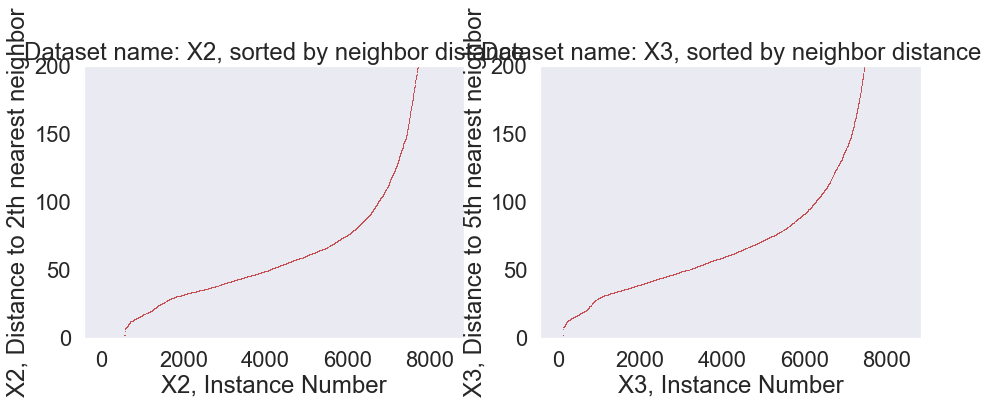

In [442]:
# lets first look at the connectivity of the graphs and distance to the nearest neighbors
from sklearn.neighbors import kneighbors_graph

#=======================================================
# CHANGE THESE VALUES TO ADJUST MINPTS FOR EACH DATASET
X2 = tfidf_subjectbody_train
X2_N = 2
X3 = tfidf_subjectbody_train
X3_N = 5
#=======================================================

# create connectivity graphs before calcualting the hierarchy
X2_knn_graph = kneighbors_graph(X2, X2_N, mode='distance') # calculate distance to four nearest neighbors 
X3_knn_graph = kneighbors_graph(X3, X3_N, mode='distance') # calculate distance to four nearest neighbors 

N2 = X2_knn_graph.shape[0]
X2_4nn_distances = np.zeros((N2,1))
for i in range(N2):
    X2_4nn_distances[i] = X2_knn_graph[i,:].max()

X2_4nn_distances = np.sort(X2_4nn_distances, axis=0)

N3 = X3_knn_graph.shape[0]
X3_4nn_distances = np.zeros((N3,1))
for i in range(N2):
    X3_4nn_distances[i] = X3_knn_graph[i,:].max()

X3_4nn_distances = np.sort(X3_4nn_distances, axis=0)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(range(N2), X2_4nn_distances, 'r.', markersize=2) #plot the data
plt.title('Dataset name: X2, sorted by neighbor distance')
plt.xlabel('X2, Instance Number')
plt.ylabel('X2, Distance to {0}th nearest neighbor'.format(X2_N))
plt.ylim([0, 200])
plt.grid()

plt.subplot(1,2,2)
plt.plot(range(N3), X3_4nn_distances, 'r.', markersize=2) #plot the data
plt.title('Dataset name: X3, sorted by neighbor distance')
plt.xlabel('X3, Instance Number')
plt.ylabel('X3, Distance to {0}th nearest neighbor'.format(X3_N))
plt.grid()
plt.ylim([0, 200])

plt.show()

In [443]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=125, min_samples=2).fit(tfidf_subjectbody_train)
labels_2_125 = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_2_125)) - (1 if -1 in labels_2_125 else 0)
print('N Clusters: ',n_clusters_)

N Clusters:  480


In [444]:
print(np.unique(labels_2_125))

[ -1   0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16
  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34
  35  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52
  53  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70
  71  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88
  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106
 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124
 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142
 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178
 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196
 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214
 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232
 233 234 235 236 237 238 239 240 241 242 243 244 24

In [445]:
#NB model can't handle -1 cluster, adding one to cluster numbers
labels_2_125 = labels_2_125 +1

In [446]:
print(np.unique(labels_2_125))

[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245 24

In [447]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=150, min_samples=5).fit(tfidf_subjectbody_train)
labels_5_150 = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels_5_150)) - (1 if -1 in labels_5_150 else 0)
print('N Clusters: ',n_clusters_)

#NB model can't handle -1 cluster, adding one to cluster numbers
labels_5_150 = labels_5_150 +1

N Clusters:  29


In [448]:
labels_5_150 = labels_5_150.reshape(len(labels_5_150),1)
labels_2_125 = labels_2_125.reshape(len(labels_2_125),1)



train a classifier for cluster numbers so model can be used to predict cluster # on new data

In [449]:
from scipy.sparse import hstack

print(tfidf_subjectbody_train.shape)
tfidf_subjectbody_train = hstack((tfidf_subjectbody_train, labels_5_150, labels_2_125))
print(tfidf_subjectbody_train.shape)


(8417, 119746)
(8417, 119748)


In [450]:
from scipy.sparse import coo_matrix

print(tfidf_subjectbody_train.shape)
temp = tfidf_subjectbody_train.tocsr()[:,:-2]
#temp = temp[:,:-2]
print(temp.shape)

(8417, 119748)
(8417, 119746)


In [451]:
model_labels_2_125 = MultinomialNB()

X_train = tfidf_subjectbody_train.tocsr()[:,:-2]
y_train = labels_2_125

model_labels_2_125.fit(X_train, y_train)

model_labels_2_125_predictions = model_labels_2_125.predict(X_train)

print('Accuracy: ',accuracy_score(model_labels_2_125_predictions, y_train))


Accuracy:  0.9567541879529523


In [452]:
from sklearn.ensemble import RandomForestClassifier

model_labels_2_125 = RandomForestClassifier()

X_train = tfidf_subjectbody_train.tocsr()[:,:-2]
y_train = labels_2_125

model_labels_2_125.fit(X_train, y_train)

model_labels_2_125_predictions = model_labels_2_125.predict(X_train)

print('Accuracy: ',accuracy_score(model_labels_2_125_predictions, y_train))

Accuracy:  1.0


In [453]:
test_labels_2_125_predictions = model_labels_2_125.predict(tfidf_subjectbody_test)
test_labels_2_125_predictions.shape

(936,)

In [454]:
from sklearn.ensemble import RandomForestClassifier

model_labels_5_150 = RandomForestClassifier()

X_train = tfidf_subjectbody_train.tocsr()[:,:-2]
y_train = labels_5_150

model_labels_5_150.fit(X_train, y_train)

model_labels_5_150_predictions = model_labels_5_150.predict(X_train)

print('Accuracy: ',accuracy_score(model_labels_5_150_predictions, y_train))

Accuracy:  1.0


In [455]:
test_labels_5_150_predictions = model_labels_5_150.predict(tfidf_subjectbody_test)
test_labels_5_150_predictions.shape

(936,)

In [456]:
test_labels_5_150_predictions = test_labels_5_150_predictions.reshape(len(test_labels_5_150_predictions),1)
test_labels_2_125_predictions = test_labels_2_125_predictions.reshape(len(test_labels_2_125_predictions),1)

In [457]:
from scipy.sparse import hstack
print(tfidf_subjectbody_test.shape)
tfidf_subjectbody_test = hstack((tfidf_subjectbody_test, test_labels_5_150_predictions, test_labels_2_125_predictions))
print(tfidf_subjectbody_test.shape)

(936, 119746)
(936, 119748)


In [458]:
model4 = MultinomialNB()

X_train = tfidf_subjectbody_train
y_train = email_modeling.Is_Spam
X_test = tfidf_subjectbody_test
y_test = email_validation.Is_Spam

model4.fit(X_train, y_train)

model4_predictions = model4.predict(X_test)

print('Accuracy: ',accuracy_score(model4_predictions, y_test))

Accuracy:  0.9871794871794872


## Adding clusters as features improved accuracy from 98.6% to 98.7%
## Now let's see if ComplimentNB is better

In [459]:
from sklearn.naive_bayes import ComplementNB
complement_nb = ComplementNB()

X_train = tfidf_subjectbody_train
y_train = email_modeling.Is_Spam
X_test = tfidf_subjectbody_test
y_test = email_validation.Is_Spam

complement_nb.fit(X_train, y_train)

complement_nb_predictions = complement_nb.predict(X_test)

print('Accuracy: ',accuracy_score(complement_nb_predictions, y_test))

Accuracy:  0.9871794871794872


In [460]:
from sklearn.model_selection import GridSearchCV

params = {'alpha': [0.01, 0.1, 0.5, 1.0, 10.0, ], 'fit_prior': ['True', 'False']
         }

complement_nb_grid = GridSearchCV(MultinomialNB(), param_grid=params, n_jobs=-1, cv=10, verbose=5)
complement_nb_grid.fit(X_train,y_train)

print('Train Accuracy : %.3f'%complement_nb_grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%complement_nb_grid.best_estimator_.score(X_test, y_test))
print('Best Accuracy Through Grid Search : %.3f'%complement_nb_grid.best_score_)
print('Best Parameters : ',complement_nb_grid.best_params_)

Fitting 10 folds for each of 10 candidates, totalling 100 fits
Train Accuracy : 0.999
Test Accuracy : 0.987
Best Accuracy Through Grid Search : 0.990
Best Parameters :  {'alpha': 1.0, 'fit_prior': 'True'}


In [461]:
final_model = MultinomialNB(alpha=1, fit_prior=True)

X_train = tfidf_subjectbody_train
y_train = email_modeling.Is_Spam
X_test = tfidf_subjectbody_test
y_test = email_validation.Is_Spam

final_model.fit(X_train, y_train)

final_model_predictions = final_model.predict(X_test)

print('Accuracy: ',accuracy_score(final_model_predictions, y_test))

Accuracy:  0.9871794871794872


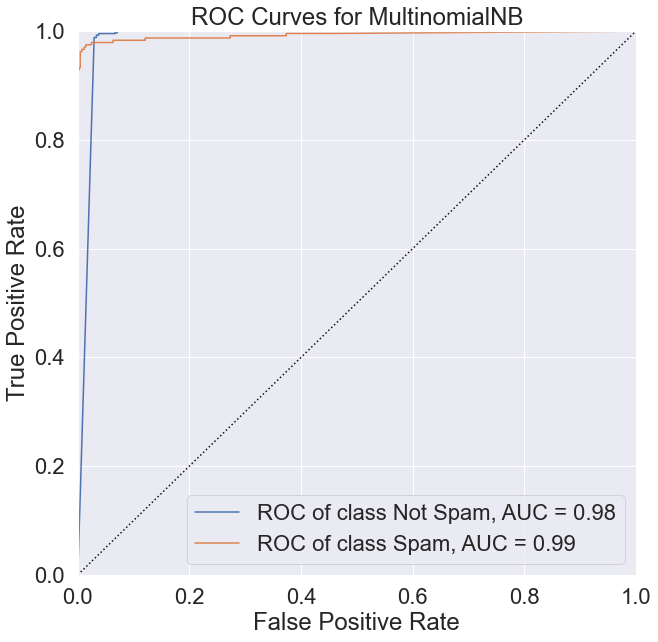

<AxesSubplot:title={'center':'ROC Curves for MultinomialNB'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [462]:
from yellowbrick.classifier import ROCAUC

viz = ROCAUC(final_model, per_class=True, classes=['Not Spam', 'Spam'], macro=False, micro=False, size=(720, 720))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show()

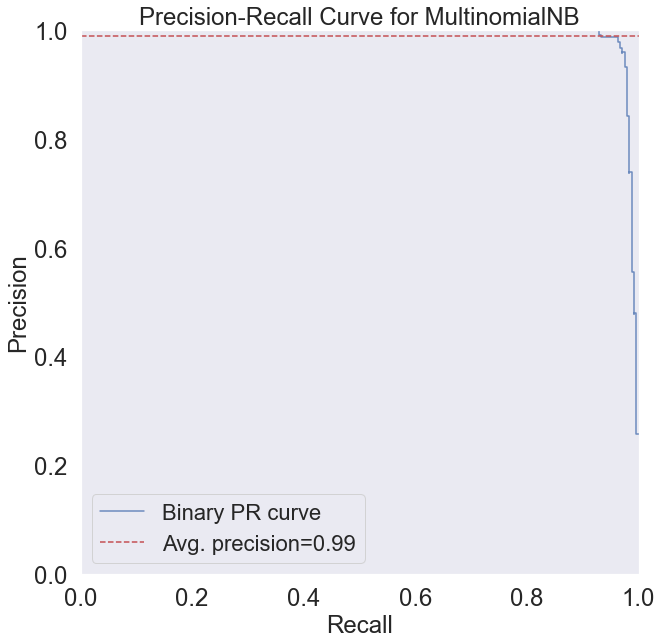

<AxesSubplot:title={'center':'Precision-Recall Curve for MultinomialNB'}, xlabel='Recall', ylabel='Precision'>

In [463]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(final_model, per_class=True, classes=['Not Spam', 'Spam'], size=(720, 720))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
for legend in viz.ax.texts:
    legend.set_fontsize(24)
for xtick,ytick in zip(viz.ax.xaxis.get_major_ticks(),viz.ax.yaxis.get_major_ticks()):
    xtick.label.set_fontsize(24) 
    ytick.label.set_fontsize(24)
viz.show()

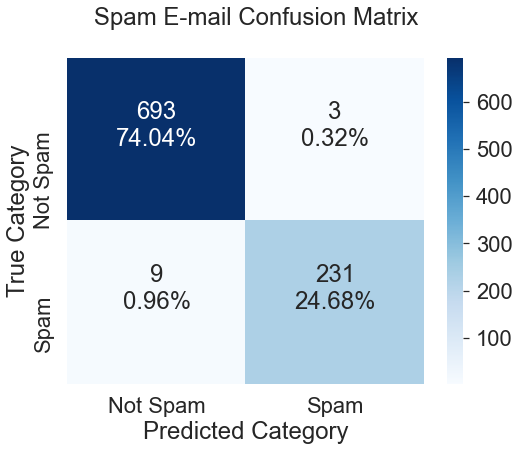

In [464]:
validation_predictions = final_model.predict(X_test)

def plot_confusion(cf_matrix):
    plt.figure(figsize=(8, 6))
    sns.set(font_scale=2)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ['{0:0.0f}'.format(value) for value in
    cf_matrix.flatten()]
    group_percentages = ['{0:.2%}'.format(value) for value in
    cf_matrix.flatten()/np.sum(cf_matrix)]
    labels = [f'{v1}\n{v2}\n' for v1, v2 in
    zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    x_axis_labels = ['Not Spam','Spam']
    y_axis_labels = ['Not Spam','Spam']
    ax = plt.axes()
    sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues',xticklabels=x_axis_labels, yticklabels=y_axis_labels)
    ax.set_title('   Spam E-mail Confusion Matrix\n')
    plt.xlabel("Predicted Category")
    plt.ylabel("True Category") 


nb_cm = confusion_matrix(y_test,validation_predictions)
plot_confusion(nb_cm)

In [465]:
from sklearn.metrics import classification_report
print(classification_report(y_test,validation_predictions, 
                            target_names=['Not Spam','Spam']))

              precision    recall  f1-score   support

    Not Spam       0.99      1.00      0.99       696
        Spam       0.99      0.96      0.97       240

    accuracy                           0.99       936
   macro avg       0.99      0.98      0.98       936
weighted avg       0.99      0.99      0.99       936



## Look at probability cutoffs to shift precision/recall

## Look at feature weights

In [466]:
print(X_test)

#tfidf vector is not scaled so nb coef_ may not refelct imprtance ranking

  (0, 111887)	8.939515260662407
  (0, 111886)	7.504258909643303
  (0, 110624)	5.619286941533918
  (0, 110269)	1.7458294422672944
  (0, 109707)	8.259919910285737
  (0, 109652)	8.092217400275203
  (0, 108689)	2.8710896724182957
  (0, 108522)	2.366766626139872
  (0, 108406)	4.734822641271441
  (0, 107089)	2.8459454906172708
  (0, 106377)	2.513566323045156
  (0, 106315)	2.726241385253351
  (0, 106062)	2.3230039456984106
  (0, 104480)	3.9813435361018916
  (0, 102861)	6.222577388706041
  (0, 102450)	7.330077348228306
  (0, 102037)	1.5760243242322385
  (0, 100353)	2.44997308209093
  (0, 100139)	3.137729783343657
  (0, 99089)	3.190122274754153
  (0, 97767)	3.3094989362458143
  (0, 97110)	5.068314249754516
  (0, 97031)	5.5383178790002505
  (0, 93159)	4.113871751915984
  (0, 93089)	3.4519558944758413
  :	:
  (910, 119747)	103.0
  (911, 119747)	1.0
  (912, 119747)	149.0
  (914, 119747)	1.0
  (915, 119747)	1.0
  (916, 119747)	1.0
  (917, 119747)	105.0
  (918, 119747)	1.0
  (919, 119747)	1.0
  (920

In [535]:
body_vocabulary = tfidf_body_fit.vocabulary_
body_vocabulary = list(body_vocabulary.keys())
subject_vocabulary = tfidf_subject_fit.vocabulary_
subject_vocabulary = list(subject_vocabulary.keys())
features=[]
for i in body_vocabulary:
    features.append(i)
for i in subject_vocabulary:
    features.append(i)
features = features + ['cluster_5_150', 'cluster_2_125']
len(features)

119748

In [548]:
coefs = final_model.coef_
df = pd.DataFrame(coefs)
df = df.set_axis([features], axis=1, inplace=False)
df.head()

,url,http,diveintomark,org,archives,2002,10,03,html,catching_update,03t22,04,05,00,_phil,ringnalda_,hey,radio,this,pre,for,you,8220,did,update,root,after,yesterday,fix,the,double,decoding,bug,in,aggregator,didn,8221,_brad,choate_,sanitize,plugin,is,movable,type,that,allows,to,clean,and,other,markup,might,exist,an,comment,entry,_scott,ambler_,process,of,database,refactoring,via,john,beimler,simple,change,schema,improves,its,design,while,retaining,both,behavioral,informational,semantics,_mac,os,hints_,convert,windows,outlook,mail,app,converting,corporate,user,who,has,all,their,old,email,pst,files,years,back,help,them,on,way,by,getting,out,proprietary,format,into,standards,based,mbox,_shelley,powers_,rdf,query,matic,light,explained,slaved,away,afternoon,persevering,my,work,spite,numerous,obstacles,sunshine,cat,lap,languor,bring,_bill,kearney_,tool,userland,using,it,will,allow,your,radio8,install,produce,rss,xml,feeds,_paul,ford_,borrowing,car,give,me,turkey,sandwich,philringnalda,com,002337,php,www,bradchoate,past,mtsanitize,agiledata,essays,databaserefactoring,000058,macosxhints,article,story,2002100306134721,weblog,burningbird,net,class_rdql,htm,000568,ideaspace,users,wkearney,misc,current,ftrain,second_toothpaste,reza,far,wrote,thread,kind,surprises,started,coding,with,then,moved,java,think,looks,like,case,experience,comprehensive,isanecdotal,they,don,know,what,re,talking,about,people,pay,wages,flyin,heck,programming,language,write,things,just,want,do,care,certainly,inparticular,ve,already,got,towork,client,systems,limited,few,ago,when,support,onlinux,was,so,terrible,ran,screaming,haven,come,yet,microsoft,announced,plan,remove,from,took,xp,be,installed,aservice,pack,somehow,can,imagine,removing,ability,torun,programs,forces,developer,solve,problems,such,as,memory,management,over,again,say,spend,any,noticeable,amount,time,managementissues,apart,fact,frequently,need,gb,patterns,architecture,high,level,stuff,if,problem,requires,application,pattern,trivial,anyway,irrespective,am,amazed,wasted,low,have,been,solved,million,times,appear,gratuitously,asserting,programmers,waste,timeon,irrelevant,dependsentirely,programmer,not,also,platform,buzzword,monolithic,set,api,or,crap,load,different,slicing,dicing,same,50,ways,unsupported,assertion,program,complexity,written,possibly,could,port,platforms,within,magnitude,cost,dunno,ported,wee,15000,line,darwin,powerpcin,minutes,sure,badly,designed,would,be10,size,harder,depended,unavailablelibraries,much,portable,code,easy,at,least,used,available,onthe,target,run,arm,no,proper,makes,sense,scientific,business,project,depend,person,imho,reduces,dependence,these,entities,individual,easier,reverse,engineer,large,applications,good,now,else,getsome,kids,hack,spaghetti,fortran,formaintenance,headaches,ad,infinitum,hardware,fast,performance,difference,between,are,relevant,more,whoah,matters,every,day,right,takingtime,waiting,job,couldwait,until,everyone,pc,enough,generate,random,ec,sin,twit,able,inefficient,codethat,market,overrun,competitors,very,end,goal,yes,those,languages,smalltalk,others,than,thinking,bits,bytes,takes,too,gray,matter,real,important,true,admit,everything,mea,maxima,culpa,working,makesme,base,rank,thoughts,hard,core,bitography,actually,most,mathematics,why,computer,scientists,insist,solving,frankly,see,relevance,issue,hand,fine,some,whatever,horses,forcourses,bye,rob,begin,pgp,signed,message,hash,sha1i,may,dense,but,anyone,utilize,habeus,potential,backdoor,defenses,against,spam,were,spammer,simply,up,server,send,headers,continue,till,reasonably,certain,reported,reconfigure,reconnect,ip,long,one,establish,connection,web,sites,directing,home,free,since,spamassassin,lose,gain,making,get,through,robin,lynn,frank,director,operations,paradigm,omega,llchttp,rights,reserved,duplication,dissemination,permitted,use,gpg,encrypted,preferred,attachments,accepted,fingerprint,08e0,567c,63cc,5642,db6d,d490,0f98,d7d3,77ea,3714key,keymaster,signature,version,gnupg,v1,gnu,linux,id8dbqe9brrzd5jx03fqnxq

In [558]:
weights = df.T
weights = weights.rename(columns={weights.columns[0]: 'Weight'})

weights = weights.sort_values(by='Weight', ascending=False)

weights.head(20)

,Weight
dues,-3.649446
cluster_2_125,-3.743002
flows,-3.784284
outnumbered,-4.415992
nllerin,-4.486126
8bb1da478aac76b57282a9305b11c81amv,-4.757145
bestem,-4.874860
a0b9bc6f874e76510933906b72baae3fmv,-4.887918
2hours,-4.905148
0702,-4.964321


In [536]:

weights = []
for i in list(final_model.coef_):
    weights.append(i)
len(weights)

1

In [520]:
#d = {'Feature':features,'Weight':final_model.coef_}

data_tuples = list(zip(list(features),list(final_model.coef_)))
data_tuples

#df = pd.DataFrame(data_tuples, columns=['Feature','Weight'])
#df.head()

[('url',
  array([ -7.0491991 ,  -6.43755943,  -9.41007218, ..., -12.94326938,
          -6.99855313,  -3.74300185]))]

How to append TF-IDF vector into pandas dataframe ?
https://www.researchgate.net/post/How_to_append_TF-IDF_vector_into_pandas_dataframe

Tf-idf Walkthrough for scikit-learn
https://github.com/rasbt/pattern_classification/blob/master/machine_learning/scikit-learn/tfidf_scikit-learn.ipynb
